In [1]:
import types
import pandas as pd
from botocore.client import Config
import ibm_boto3

def __iter__(self): return 0

# @hidden_cell
# The following code accesses a file in your IBM Cloud Object Storage. It includes your credentials.
# You might want to remove those credentials before you share your notebook.
client_33a8ac489a7349b3a4824e8fd18206ce = ibm_boto3.client(service_name='s3',
    ibm_api_key_id='ei3i3X-bixt3w6EDXuADOp5DgJX_-6PpQV0ZlwFVY5xm',
    ibm_auth_endpoint="https://iam.bluemix.net/oidc/token",
    config=Config(signature_version='oauth'),
    endpoint_url='https://s3-api.us-geo.objectstorage.service.networklayer.com')

body = client_33a8ac489a7349b3a4824e8fd18206ce.get_object(Bucket='datascience-donotdelete-pr-zredannfik1y9z',Key='taxi_trip.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data = pd.read_csv(body)
df_data.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435


In [2]:
df_data.shape

(1458644, 11)

In [3]:
df = df_data.copy()

In [4]:
west, south, east, north = -74.03, 40.63, -73.77, 40.85

df = df[(df.pickup_latitude> south) & (df.pickup_latitude < north)]
df = df[(df.dropoff_latitude> south) & (df.dropoff_latitude < north)]
df = df[(df.pickup_longitude> west) & (df.pickup_longitude < east)]
df = df[(df.dropoff_longitude> west) & (df.dropoff_longitude < east)]

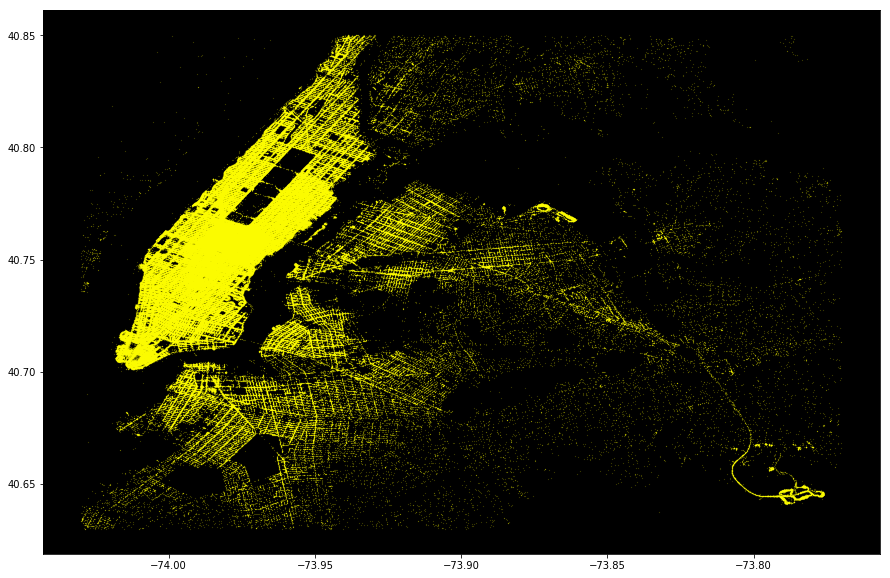

In [6]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(15,10))
plt.scatter(x=df['dropoff_longitude'], y=df['dropoff_latitude'], s = 0.02, alpha = 0.6, color='yellow')
ax.set_facecolor('black')

In [7]:
!pip install folium

    100% |████████████████████████████████| 92kB 2.0MB/s ta 0:00:01
tensorflow 1.3.0 requires tensorflow-tensorboard<0.2.0,>=0.1.0, which is not installed.


In [8]:
import folium

In [9]:
base_map = folium.Map(tiles = 'stamen terrain', location=[40.693943, -73.985880], control_scale=True, zoom_start=12)
base_map

In [10]:
df_fil = df.head(10000).copy()

In [11]:
from folium.plugins import HeatMap
data = df_fil[['pickup_latitude','pickup_longitude']].values.tolist()

In [12]:
HeatMap(data=data, radius=8).add_to(base_map)

In [13]:
base_map

In [14]:
df.pickup_datetime = pd.to_datetime(df.pickup_datetime, format = '%Y-%m-%d %H:%M:%S')

In [15]:
def getMonth(x):
    return x.month
def getDay(x):
    return x.day
def getHour(x):
    return x.hour
df['month'] = df.pickup_datetime.apply(getMonth)
df['day'] = df.pickup_datetime.apply(getDay)
df['hour'] = df.pickup_datetime.apply(getHour)

In [16]:
df_fil = df.head(10000).copy()

In [17]:
grouped = df_fil.groupby('month')
x = grouped.get_group(2)
x.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,month,day,hour
12,id1187965,2,2016-02-19 09:52:46,2016-02-19 10:11:20,2,-73.962982,40.756680,-73.984406,40.760719,N,1114,2,19,9
20,id2070428,1,2016-02-28 02:23:02,2016-02-28 02:31:08,1,-73.980370,40.742420,-73.962852,40.760635,N,486,2,28,2
25,id0129640,2,2016-02-14 13:27:56,2016-02-14 13:49:19,1,-73.956581,40.771358,-73.974968,40.732792,N,1283,2,14,13
26,id3587298,1,2016-02-27 21:56:01,2016-02-27 22:14:51,1,-73.983765,40.749874,-73.958832,40.800961,N,1130,2,27,21
44,id3326491,2,2016-02-12 07:41:56,2016-02-12 07:51:15,1,-73.979645,40.739632,-73.994728,40.723495,N,559,2,12,7


In [18]:
final_df = []
grouped = df_fil.groupby('month')
for i in range(1,7):
    temp = grouped.get_group(i).copy()
    final_df.append(temp[['pickup_latitude', 'pickup_longitude']].values.tolist())

In [19]:
from folium.plugins import HeatMapWithTime
base_map = folium.Map(location=[40.693943, -73.985880], control_scale=True, zoom_start=12, tiles='stamen terrain')
HeatMapWithTime(final_df, radius=5).add_to(base_map)

In [20]:
base_map

In [21]:
df_fil = df[(df.month==5)].copy()

In [25]:
final_df = []
grouped = df_fil.groupby('day')
for i in range(1,30):
    temp = grouped.get_group(i).copy()
    final_df.append(temp[['pickup_latitude', 'pickup_longitude']].values.tolist())

In [26]:
from folium.plugins import HeatMapWithTime
base_map = folium.Map(location=[40.693943, -73.985880], control_scale=True, zoom_start=12, tiles='stamen terrain')
HeatMapWithTime(final_df, radius=5).add_to(base_map)

In [27]:
base_map

In [ ]:
import folium

In [ ]:
x = (32.900908, -97.040335)
y = (40.768571, -73.861603)
coordinates=[x,y]

map = folium.Map(location=[32.900908, -97.040335], zoom_start=4)

line=folium.PolyLine(locations=coordinates,weight=2,color = 'blue')
map.add_child(line)

![](https://images-na.ssl-images-amazon.com/images/I/71RgfIeTq6L._SL1148_.jpg)

<img src="https://images-na.ssl-images-amazon.com/images/I/71RgfIeTq6L._SL1148_.jpg" style="height:500px">